In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
!pip install deeplake

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.5/586.5 kB 15.9 MB/s eta 0:00:00
  Installing build dependencies ... - \ | / done
  Getting requirements to build wheel ... - done
  Preparing metadata (pyproject.toml) ... - done
  Obtaining dependency information for humbug>=0.3.1 from https://files.pythonhosted.org/packages/c8/cc/c8129d6e9a1f473b5e90cf1b8eac43191a22657b9b673e02815548662270/humbug-0.3.2-py3-none-any.whl.metadata
  Obtaining dependency information for libdeeplake==0.0.104 from https://files.pythonhosted.org/packages/e8/cb/bd95db54bc1dd914b0bafa0154fc9cf4e8fa188d86b39330769e9e19b1c5/libdeeplake-0.0.104-cp310-cp310-manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for aioboto3>=10.4.0 from https://files.pythonhosted.org/packages/2d/69/e375ee955f67eb468d5bc907423bdbdb39cbdd2012652e8abd98ba0bb255/aioboto3-12.3.0-py3-none-any.whl.metadata
  Obtaining dependency information for aiobotocore[boto3]==2.11.2 from https://files.pythonhosted.org/packag

In [6]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [7]:
x = load('/kaggle/input/places365/val_256/valid_samples/Places365_val_00000054.jpg')
print(x.shape)

(256, 256, 3)


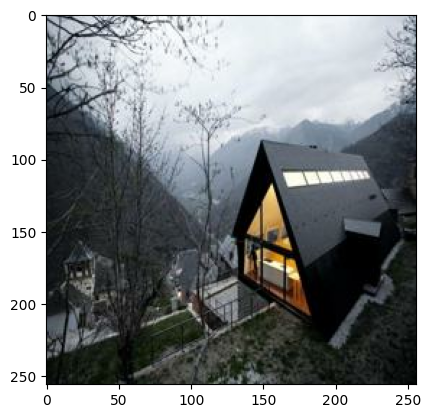

In [8]:
plt.imshow(x/255.0)

In [9]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [10]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

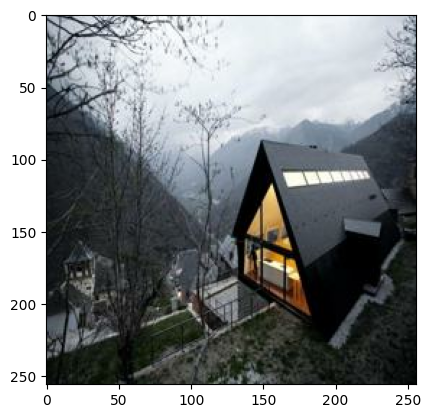

In [11]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [12]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [13]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [14]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

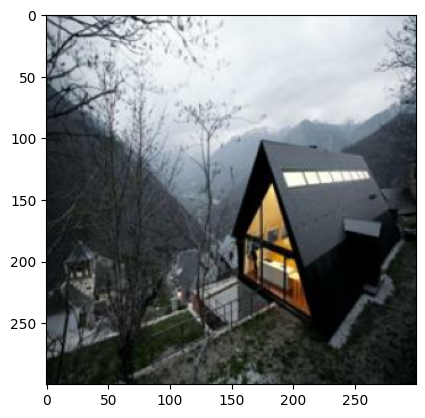

In [16]:
x = resize_with_aspect_ratio(x,300)
plt.imshow(x/255)

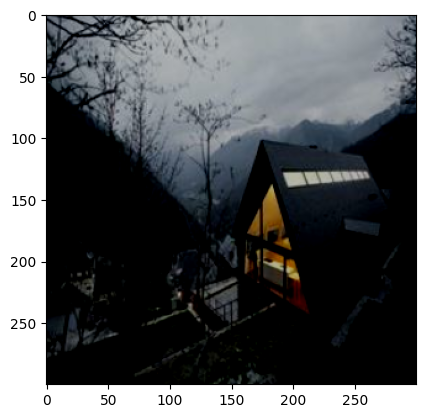

In [17]:
x_brightness = tf.image.random_brightness(x, 75)
plt.imshow(x_brightness/255)

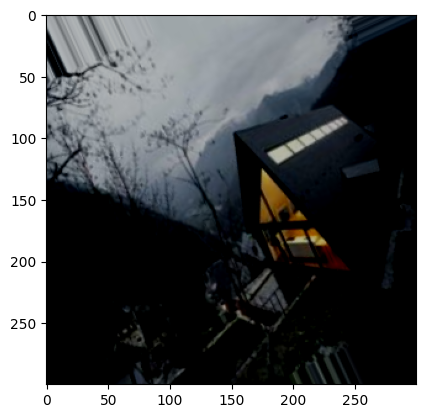

In [18]:
# Define the rotation angle in radians
rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

# Apply the rotation using tfa.image.rotate
x_rotated = tfa.image.rotate(x_brightness, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
plt.imshow(x_rotated/255)

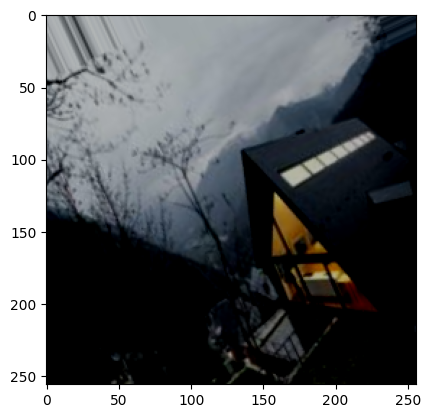

In [19]:
x_aug = random_crop(x_rotated)
plt.imshow(x_aug/255.0)

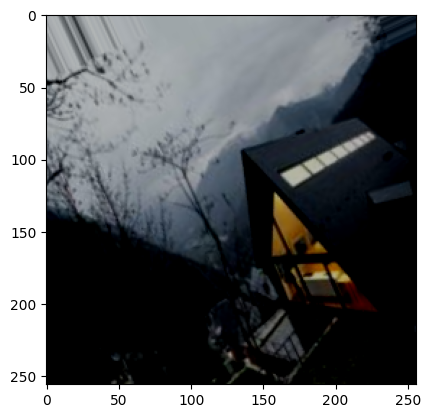

In [20]:
x_jitter = random_jitter(x_aug)
plt.imshow(x_jitter/255.0)

In [21]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 75)
    # Define the rotation angle in radians
    rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
    real_image = random_crop(real_image)
    

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [22]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [23]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [24]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files('/kaggle/input/places365/val_256/train_samples/*')
train_dataset = train_dataset.shuffle(10,reshuffle_each_iteration=True)
train_dataset = train_dataset.take(20000)
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

1250

In [25]:
# create input pipeline
val = tf.data.Dataset.list_files('/kaggle/input/places365/val_256/valid_samples/*')
val = val.take(1000)
val = val.map(load_test_image)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [26]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [27]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [28]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [29]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

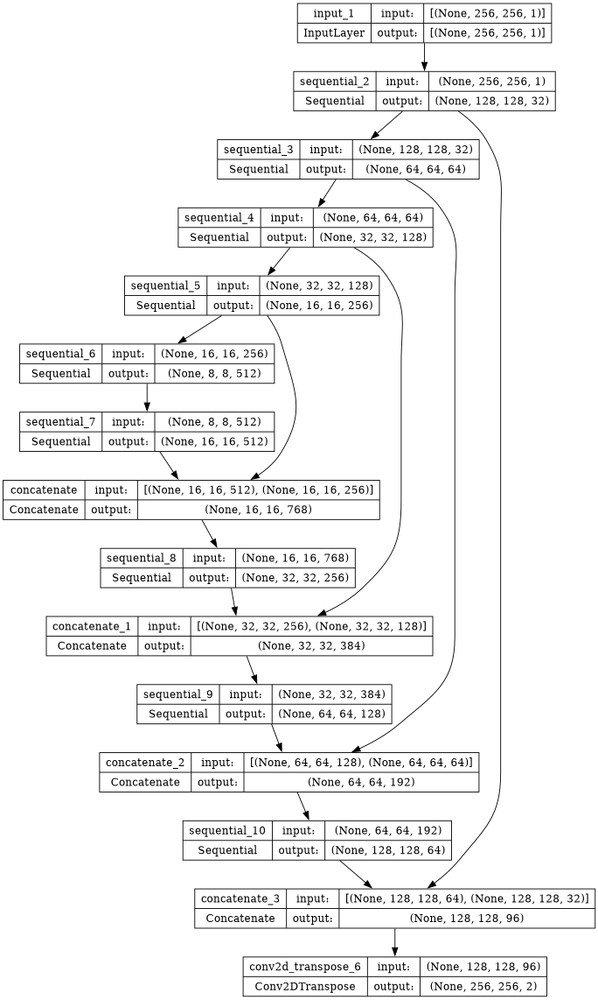

In [30]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [31]:
gen.load_weights('/kaggle/input/trainwithchangeinaugparamplaces365/modelsFeb7/gen_weight.keras')

In [32]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

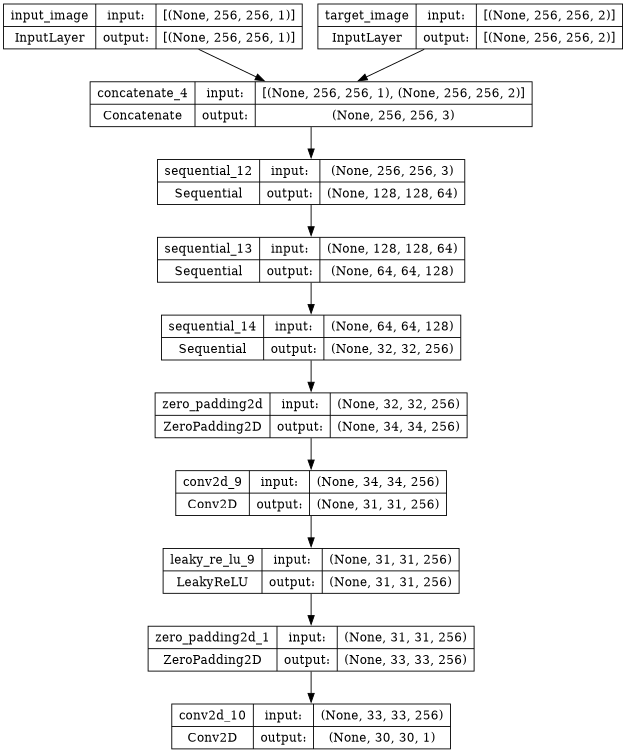

In [33]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [34]:
disc.load_weights('/kaggle/input/trainwithchangeinaugparamplaces365/modelsFeb7/disc_wweight.keras')

In [35]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [36]:
LAMBDA = 150

In [37]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [38]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [39]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [40]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [41]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [42]:
epochs = 250

In [43]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [44]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [45]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [46]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [47]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [48]:
os.mkdir('/kaggle/working/gen_output/')

In [49]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [50]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image,256)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


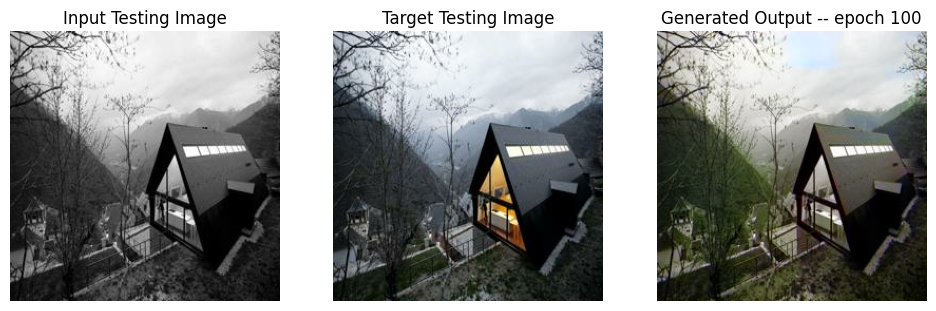

SSIM Score: 0.9646493792533875
PSNR Score: 27.115528106689453


In [51]:
display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000054.jpg',100)

In [52]:
os.mkdir('/kaggle/working/modelsFeb7')

In [53]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        gen.save('/kaggle/working/modelsFeb7/gen.h5')
        gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
        disc.save('/kaggle/working/modelsFeb7/disc.h5')
        disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')
        if time.time() - time_start > 41000:
            stop_training = True
#         if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
        display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000054.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [54]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 3s 0us/step
Training Details
Generator-- total_loss:10.49973 gan_loss:1.78628 l1_loss:0.04913 perceptual_loss:0.00896 Discriminator-- total_loss:2.05045 real_loss:1.01709 generated_loss:1.03335 --- SSIM 0.87131 PSNR 22.35760 LPIPS 0.00000
Time taken for epoch 1 is 1569.42316365242 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.76782 gan_loss:0.92125 l1_loss:0.04436  perceptual_loss:0.00795 Discriminator-- total_loss:1.37797 real_loss:0.66570 generated_loss:0.71227 --- SSIM 0.92689 PSNR 23.04769 LPIPS 0.00000
Time taken for epoch 1 is 1611.842777967453 sec
Number of iteration 63


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Displaying one random test image...


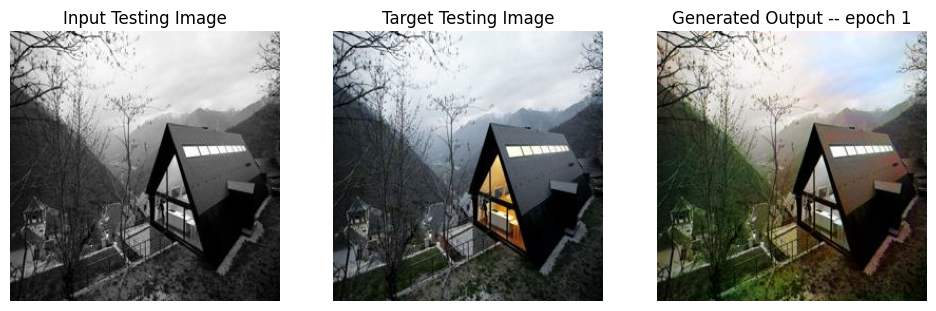

SSIM Score: 0.9425409436225891
PSNR Score: 25.28781509399414
Epoch 1
Training Details
Generator-- total_loss:9.63369 gan_loss:1.15137 l1_loss:0.04799 perceptual_loss:0.00856 Discriminator-- total_loss:1.26918 real_loss:0.60617 generated_loss:0.66301 --- SSIM 0.87771 PSNR 22.40756 LPIPS 0.00000
Time taken for epoch 2 is 1535.4082629680634 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.18904 gan_loss:0.42046 l1_loss:0.04369  perceptual_loss:0.00810 Discriminator-- total_loss:1.68603 real_loss:1.28686 generated_loss:0.39917 --- SSIM 0.92073 PSNR 22.94515 LPIPS 0.00000
Time taken for epoch 2 is 1576.6336314678192 sec
Number of iteration 63
Displaying one random test image...


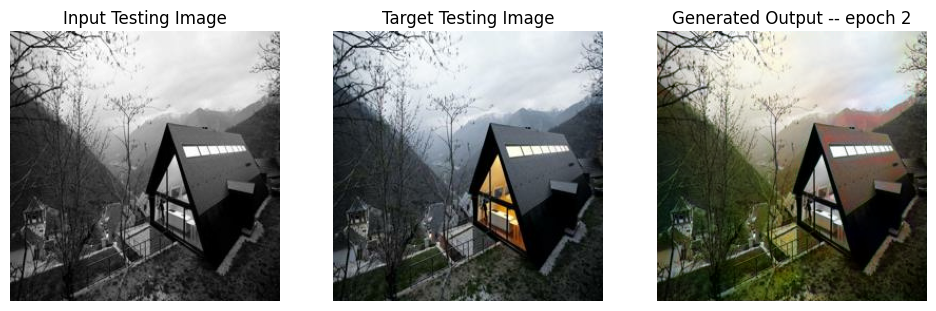

SSIM Score: 0.9386062622070312
PSNR Score: 24.538509368896484
Epoch 2
Training Details
Generator-- total_loss:9.65498 gan_loss:1.13030 l1_loss:0.04822 perceptual_loss:0.00861 Discriminator-- total_loss:1.20249 real_loss:0.57210 generated_loss:0.63040 --- SSIM 0.87645 PSNR 22.30777 LPIPS 0.00000
Time taken for epoch 3 is 1509.9461710453033 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.80491 gan_loss:0.76712 l1_loss:0.04503  perceptual_loss:0.00856 Discriminator-- total_loss:1.62733 real_loss:0.65677 generated_loss:0.97057 --- SSIM 0.92696 PSNR 23.25556 LPIPS 0.00000
Time taken for epoch 3 is 1550.272587776184 sec
Number of iteration 63
Displaying one random test image...


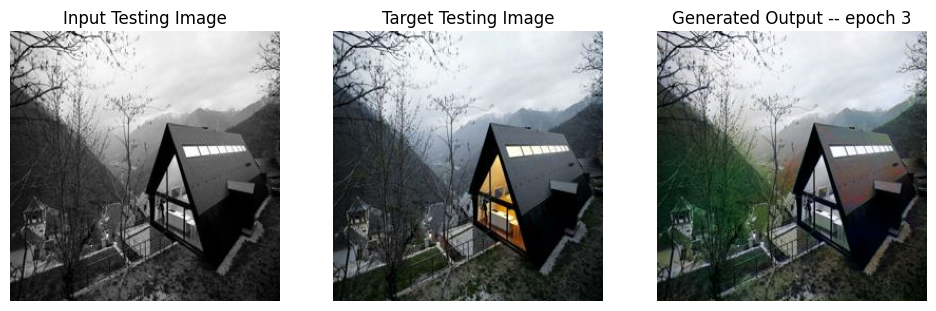

SSIM Score: 0.9568876624107361
PSNR Score: 28.127653121948242
Epoch 3
Training Details
Generator-- total_loss:9.68478 gan_loss:1.12707 l1_loss:0.04838 perceptual_loss:0.00867 Discriminator-- total_loss:1.18640 real_loss:0.56234 generated_loss:0.62406 --- SSIM 0.87569 PSNR 22.26620 LPIPS 0.00000
Time taken for epoch 4 is 1490.5336186885834 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.57211 gan_loss:0.89105 l1_loss:0.04934  perceptual_loss:0.00853 Discriminator-- total_loss:1.41602 real_loss:0.59219 generated_loss:0.82383 --- SSIM 0.91427 PSNR 22.21167 LPIPS 0.00000
Time taken for epoch 4 is 1530.8529398441315 sec
Number of iteration 63
Displaying one random test image...


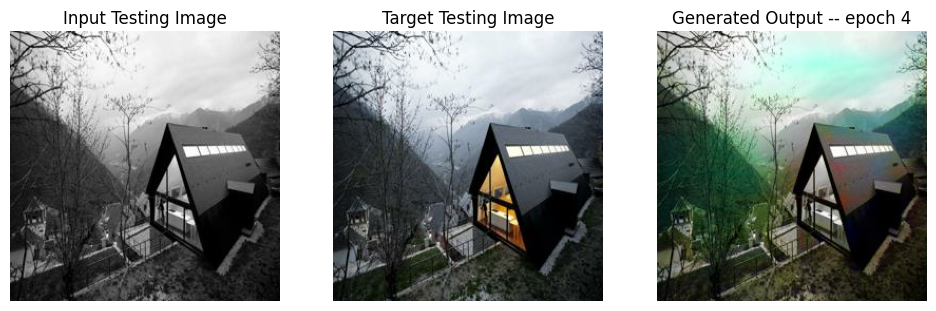

SSIM Score: 0.9453582763671875
PSNR Score: 25.51213836669922
Epoch 4
Training Details
Generator-- total_loss:9.70741 gan_loss:1.13991 l1_loss:0.04837 perceptual_loss:0.00875 Discriminator-- total_loss:1.16511 real_loss:0.55103 generated_loss:0.61409 --- SSIM 0.87462 PSNR 22.24685 LPIPS 0.00000
Time taken for epoch 5 is 1497.2221188545227 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.09942 gan_loss:0.76373 l1_loss:0.04706  perceptual_loss:0.00851 Discriminator-- total_loss:1.38703 real_loss:0.67203 generated_loss:0.71500 --- SSIM 0.91859 PSNR 22.18144 LPIPS 0.00000
Time taken for epoch 5 is 1538.8693721294403 sec
Number of iteration 63
Displaying one random test image...


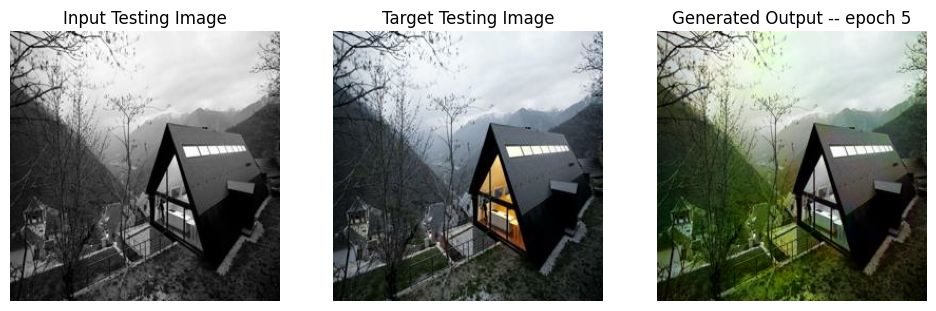

SSIM Score: 0.921011209487915
PSNR Score: 24.034242630004883
Epoch 5
Training Details
Generator-- total_loss:9.68281 gan_loss:1.12403 l1_loss:0.04833 perceptual_loss:0.00873 Discriminator-- total_loss:1.15708 real_loss:0.54621 generated_loss:0.61087 --- SSIM 0.87572 PSNR 22.26402 LPIPS 0.00000
Time taken for epoch 6 is 1506.4257190227509 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.37351 gan_loss:1.17480 l1_loss:0.04625  perceptual_loss:0.00840 Discriminator-- total_loss:1.44351 real_loss:0.39563 generated_loss:1.04788 --- SSIM 0.91071 PSNR 22.78777 LPIPS 0.00000
Time taken for epoch 6 is 1548.2410125732422 sec
Number of iteration 63
Displaying one random test image...


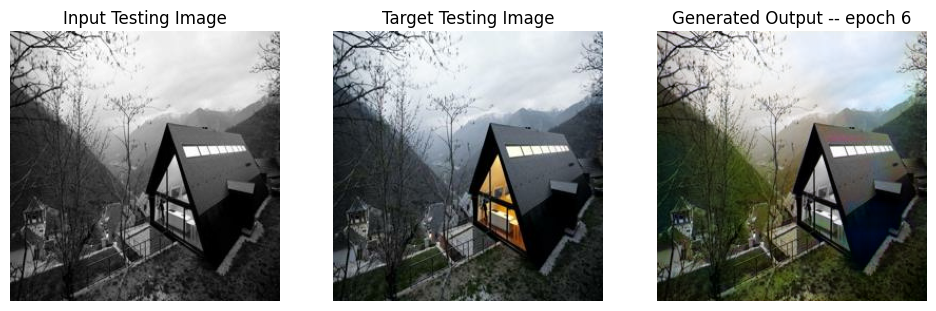

SSIM Score: 0.9335465431213379
PSNR Score: 25.992265701293945
Epoch 6
Training Details
Generator-- total_loss:9.68382 gan_loss:1.11757 l1_loss:0.04836 perceptual_loss:0.00875 Discriminator-- total_loss:1.16323 real_loss:0.54947 generated_loss:0.61377 --- SSIM 0.87621 PSNR 22.25487 LPIPS 0.00000
Time taken for epoch 7 is 1502.8225357532501 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.95063 gan_loss:1.44817 l1_loss:0.04847  perceptual_loss:0.00822 Discriminator-- total_loss:1.59632 real_loss:0.35958 generated_loss:1.23674 --- SSIM 0.91270 PSNR 22.39152 LPIPS 0.00000
Time taken for epoch 7 is 1543.7102460861206 sec
Number of iteration 63
Displaying one random test image...


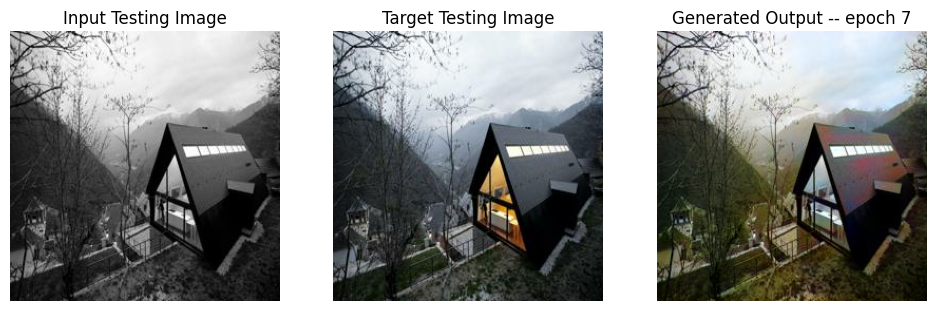

SSIM Score: 0.9422991275787354
PSNR Score: 25.46312713623047
Epoch 7
Training Details
Generator-- total_loss:9.68695 gan_loss:1.13419 l1_loss:0.04827 perceptual_loss:0.00875 Discriminator-- total_loss:1.14459 real_loss:0.54001 generated_loss:0.60459 --- SSIM 0.87425 PSNR 22.29223 LPIPS 0.00000
Time taken for epoch 8 is 1515.0128819942474 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.17850 gan_loss:0.54183 l1_loss:0.04248  perceptual_loss:0.00843 Discriminator-- total_loss:1.44044 real_loss:0.93990 generated_loss:0.50054 --- SSIM 0.92649 PSNR 23.63902 LPIPS 0.00000
Time taken for epoch 8 is 1555.8773436546326 sec
Number of iteration 63
Displaying one random test image...


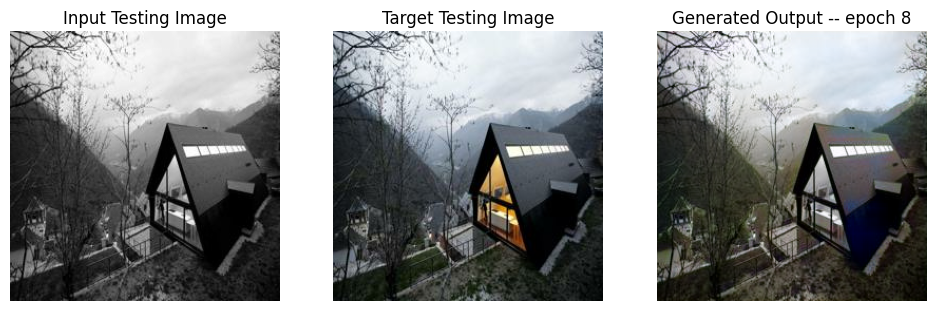

SSIM Score: 0.9576363563537598
PSNR Score: 28.494964599609375
Epoch 8
Training Details
Generator-- total_loss:9.70937 gan_loss:1.13786 l1_loss:0.04835 perceptual_loss:0.00879 Discriminator-- total_loss:1.13928 real_loss:0.53578 generated_loss:0.60349 --- SSIM 0.87563 PSNR 22.27431 LPIPS 0.00000
Time taken for epoch 9 is 1506.310597896576 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.34657 gan_loss:0.90884 l1_loss:0.04785  perceptual_loss:0.00840 Discriminator-- total_loss:1.42808 real_loss:0.60432 generated_loss:0.82376 --- SSIM 0.91768 PSNR 22.31677 LPIPS 0.00000
Time taken for epoch 9 is 1547.3741688728333 sec
Number of iteration 63
Displaying one random test image...


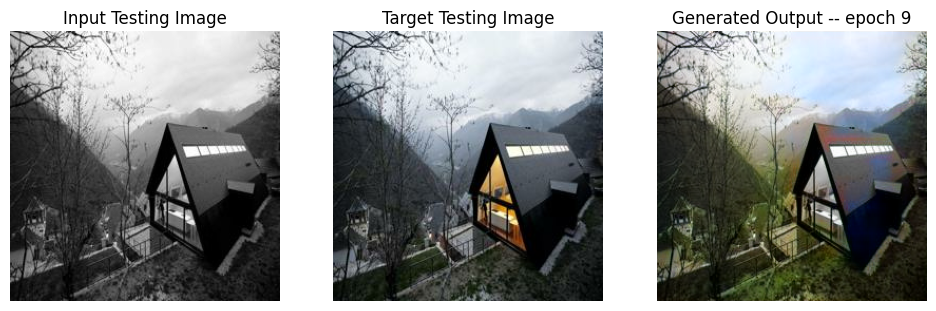

SSIM Score: 0.934887707233429
PSNR Score: 25.53067970275879
Epoch 9
Training Details
Generator-- total_loss:7.88892 gan_loss:0.35665 l1_loss:0.04197 perceptual_loss:0.00825 Discriminator-- total_loss:2.60819 real_loss:1.70780 generated_loss:0.90039 --- SSIM 0.89886 PSNR 23.92926 LPIPS 0.00000
Time taken for epoch 10 is 1367.309076309204 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.15257 gan_loss:0.72853 l1_loss:0.04169  perceptual_loss:0.00780 Discriminator-- total_loss:1.65413 real_loss:0.71124 generated_loss:0.94289 --- SSIM 0.93235 PSNR 23.94384 LPIPS 0.00000
Time taken for epoch 10 is 1407.9511992931366 sec
Number of iteration 63
Displaying one random test image...


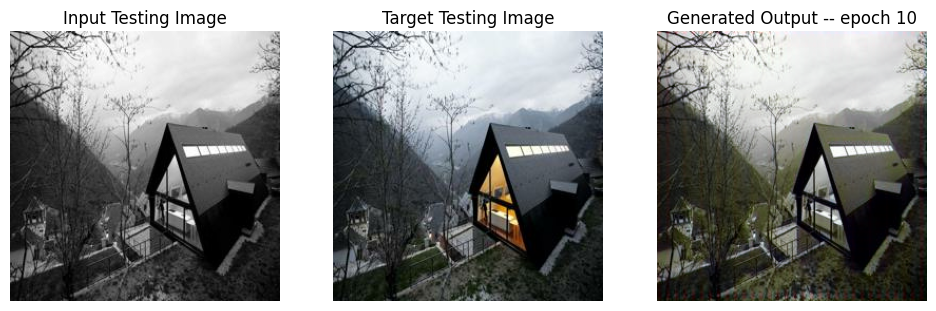

SSIM Score: 0.9596268534660339
PSNR Score: 27.473623275756836
Epoch 10
Training Details
Generator-- total_loss:7.76028 gan_loss:0.23319 l1_loss:0.04199 perceptual_loss:0.00819 Discriminator-- total_loss:2.83040 real_loss:1.94224 generated_loss:0.88817 --- SSIM 0.89544 PSNR 23.94716 LPIPS 0.00000
Time taken for epoch 11 is 1370.0243344306946 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.04643 gan_loss:0.70734 l1_loss:0.04078  perceptual_loss:0.00814 Discriminator-- total_loss:1.66599 real_loss:0.73813 generated_loss:0.92786 --- SSIM 0.93153 PSNR 24.08551 LPIPS 0.00000
Time taken for epoch 11 is 1410.3617136478424 sec
Number of iteration 63
Displaying one random test image...


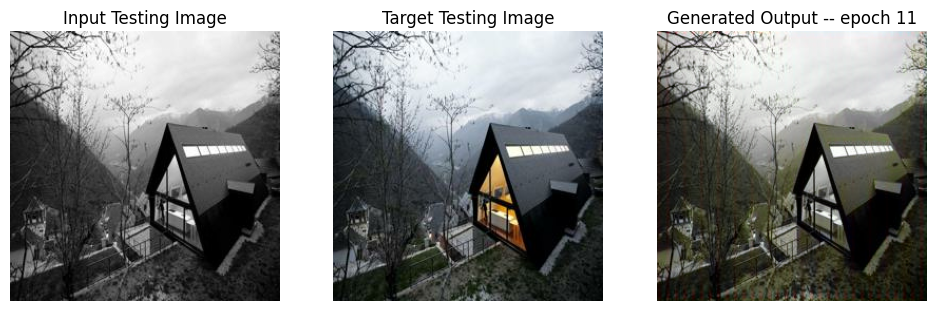

SSIM Score: 0.9607105255126953
PSNR Score: 27.52303123474121
Epoch 11
Training Details
Generator-- total_loss:20.24425 gan_loss:12.75264 l1_loss:0.04185 perceptual_loss:0.00809 Discriminator-- total_loss:0.00608 real_loss:0.00260 generated_loss:0.00349 --- SSIM 0.89491 PSNR 23.93981 LPIPS 0.00000
Time taken for epoch 12 is 1024.9124774932861 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.33286 gan_loss:0.06287 l1_loss:0.04082  perceptual_loss:0.00764 Discriminator-- total_loss:3.97800 real_loss:3.85632 generated_loss:0.12168 --- SSIM 0.93117 PSNR 24.15740 LPIPS 0.00000
Time taken for epoch 12 is 1065.4311077594757 sec
Number of iteration 63
Displaying one random test image...


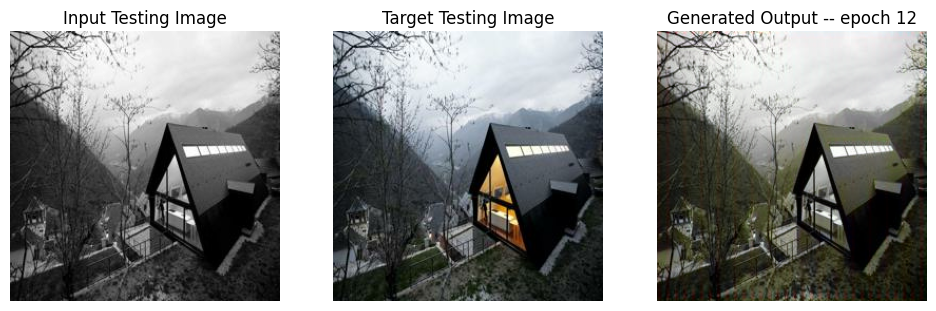

SSIM Score: 0.9587122797966003
PSNR Score: 27.27634620666504
Epoch 12
Training Details
Generator-- total_loss:23.43711 gan_loss:15.94221 l1_loss:0.04188 perceptual_loss:0.00809 Discriminator-- total_loss:0.00008 real_loss:0.00003 generated_loss:0.00005 --- SSIM 0.89496 PSNR 23.93855 LPIPS 0.00000
Time taken for epoch 13 is 1023.5156350135803 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.35716 gan_loss:0.01901 l1_loss:0.04116  perceptual_loss:0.00776 Discriminator-- total_loss:5.42791 real_loss:5.37069 generated_loss:0.05722 --- SSIM 0.92994 PSNR 24.03171 LPIPS 0.00000
Time taken for epoch 13 is 1064.426558971405 sec
Number of iteration 63
Displaying one random test image...


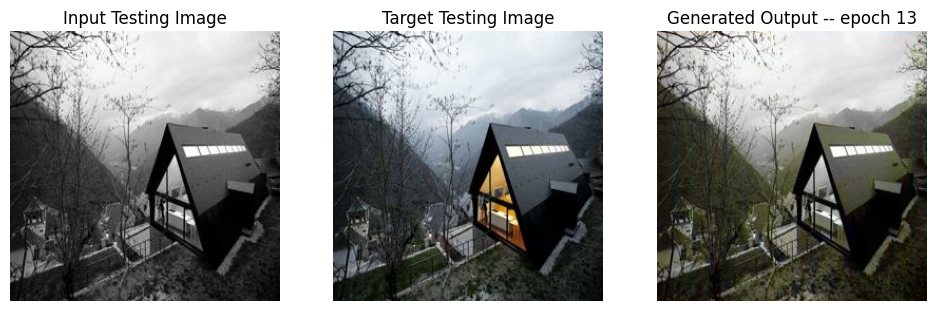

SSIM Score: 0.9587674736976624
PSNR Score: 27.27276039123535
Epoch 13
Training Details
Generator-- total_loss:24.73466 gan_loss:17.23148 l1_loss:0.04191 perceptual_loss:0.00811 Discriminator-- total_loss:0.00003 real_loss:0.00001 generated_loss:0.00002 --- SSIM 0.89488 PSNR 23.93092 LPIPS 0.00000
Time taken for epoch 14 is 1026.220677614212 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.53663 gan_loss:0.02430 l1_loss:0.04205  perceptual_loss:0.00803 Discriminator-- total_loss:5.35946 real_loss:5.32208 generated_loss:0.03738 --- SSIM 0.93142 PSNR 24.04101 LPIPS 0.00000
Time taken for epoch 14 is 1066.9118056297302 sec
Number of iteration 63
Displaying one random test image...


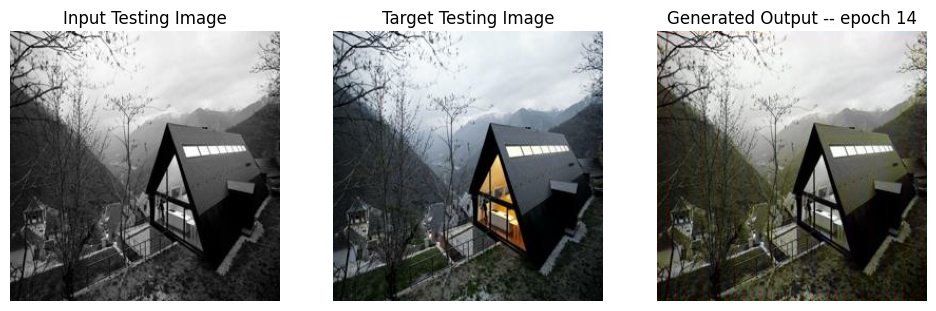

SSIM Score: 0.9585220217704773
PSNR Score: 27.251619338989258
Epoch 14
Training Details
Generator-- total_loss:27.88644 gan_loss:20.39905 l1_loss:0.04183 perceptual_loss:0.00809 Discriminator-- total_loss:0.00004 real_loss:0.00002 generated_loss:0.00002 --- SSIM 0.89457 PSNR 23.93463 LPIPS 0.00000
Time taken for epoch 15 is 1031.660127878189 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.28418 gan_loss:0.06549 l1_loss:0.04017  perceptual_loss:0.00796 Discriminator-- total_loss:4.56522 real_loss:4.46920 generated_loss:0.09602 --- SSIM 0.93262 PSNR 24.13452 LPIPS 0.00000
Time taken for epoch 15 is 1072.566030740738 sec
Number of iteration 63
Displaying one random test image...


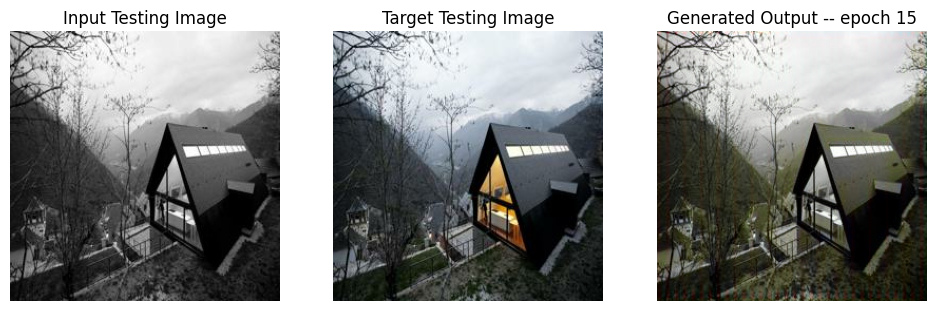

SSIM Score: 0.958666980266571
PSNR Score: 27.275522232055664
Epoch 15
Training Details
Generator-- total_loss:30.06181 gan_loss:22.56963 l1_loss:0.04184 perceptual_loss:0.00811 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.89493 PSNR 23.94945 LPIPS 0.00000
Time taken for epoch 16 is 1030.8194637298584 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.21800 gan_loss:0.01481 l1_loss:0.04007  perceptual_loss:0.00795 Discriminator-- total_loss:6.53670 real_loss:6.50789 generated_loss:0.02881 --- SSIM 0.93240 PSNR 24.13734 LPIPS 0.00000
Time taken for epoch 16 is 1070.9047501087189 sec
Number of iteration 63
Displaying one random test image...


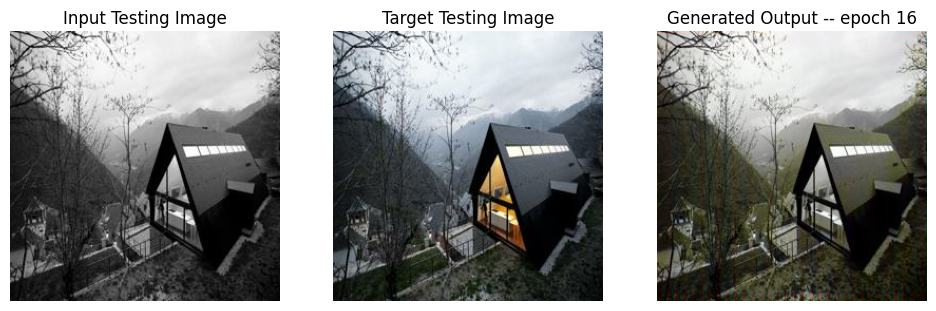

SSIM Score: 0.9585902690887451
PSNR Score: 27.256155014038086
Epoch 16
Training Details
Generator-- total_loss:34.81756 gan_loss:27.33260 l1_loss:0.04180 perceptual_loss:0.00810 Discriminator-- total_loss:0.09782 real_loss:0.05081 generated_loss:0.04701 --- SSIM 0.89505 PSNR 23.94151 LPIPS 0.00000
Time taken for epoch 17 is 1029.1040999889374 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.62729 gan_loss:0.32424 l1_loss:0.04088  perceptual_loss:0.00781 Discriminator-- total_loss:3.94588 real_loss:3.81612 generated_loss:0.12975 --- SSIM 0.93257 PSNR 24.17066 LPIPS 0.00000
Time taken for epoch 17 is 1069.5508217811584 sec
Number of iteration 63
Displaying one random test image...


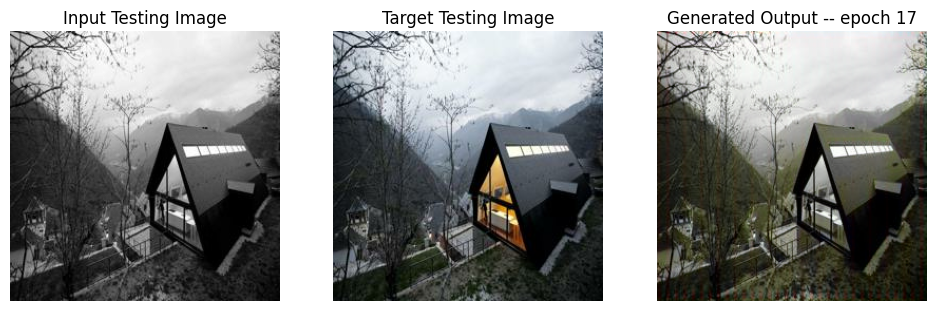

SSIM Score: 0.9585719704627991
PSNR Score: 27.246816635131836
Epoch 17
Training Details
Generator-- total_loss:49.47431 gan_loss:41.98412 l1_loss:0.04183 perceptual_loss:0.00810 Discriminator-- total_loss:0.00047 real_loss:0.00025 generated_loss:0.00022 --- SSIM 0.89500 PSNR 23.94221 LPIPS 0.00000
Time taken for epoch 18 is 1016.7199845314026 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.24469 gan_loss:0.08392 l1_loss:0.03995  perceptual_loss:0.00779 Discriminator-- total_loss:5.73968 real_loss:5.72242 generated_loss:0.01726 --- SSIM 0.93471 PSNR 24.26619 LPIPS 0.00000
Time taken for epoch 18 is 1057.4337785243988 sec
Number of iteration 63
Displaying one random test image...


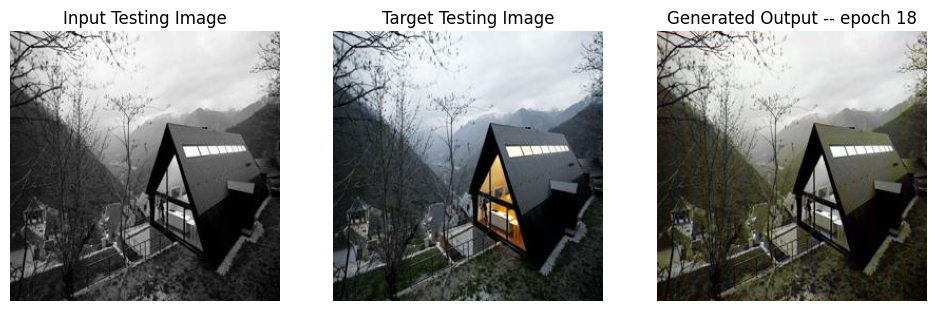

SSIM Score: 0.9586215019226074
PSNR Score: 27.268882751464844
Epoch 18
Training Details
Generator-- total_loss:50.04187 gan_loss:42.54925 l1_loss:0.04184 perceptual_loss:0.00811 Discriminator-- total_loss:0.00009 real_loss:0.00004 generated_loss:0.00006 --- SSIM 0.89462 PSNR 23.94298 LPIPS 0.00000
Time taken for epoch 19 is 1033.9786756038666 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.55615 gan_loss:0.08784 l1_loss:0.04172  perceptual_loss:0.00807 Discriminator-- total_loss:5.50997 real_loss:5.50002 generated_loss:0.00995 --- SSIM 0.93126 PSNR 23.97174 LPIPS 0.00000
Time taken for epoch 19 is 1074.1579213142395 sec
Number of iteration 63
Displaying one random test image...


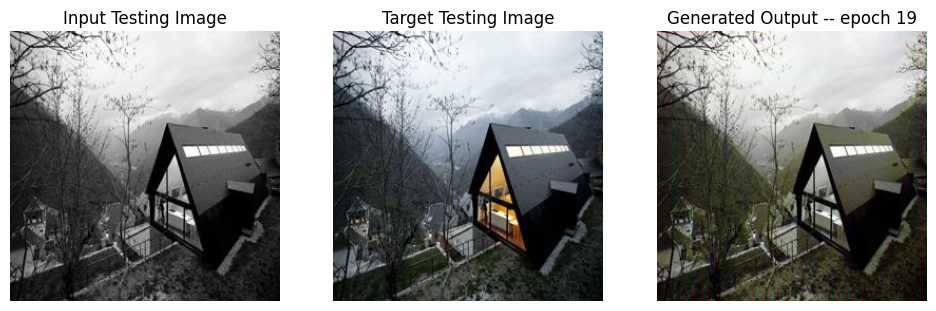

SSIM Score: 0.9591037631034851
PSNR Score: 27.310453414916992
Epoch 19
Training Details
Generator-- total_loss:50.24555 gan_loss:42.75259 l1_loss:0.04184 perceptual_loss:0.00811 Discriminator-- total_loss:0.00005 real_loss:0.00002 generated_loss:0.00003 --- SSIM 0.89381 PSNR 23.93473 LPIPS 0.00000
Time taken for epoch 20 is 1034.1414184570312 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.27471 gan_loss:0.05703 l1_loss:0.04031  perceptual_loss:0.00780 Discriminator-- total_loss:6.55159 real_loss:6.54727 generated_loss:0.00432 --- SSIM 0.93252 PSNR 24.20037 LPIPS 0.00000
Time taken for epoch 20 is 1074.3989915847778 sec
Number of iteration 63
Displaying one random test image...


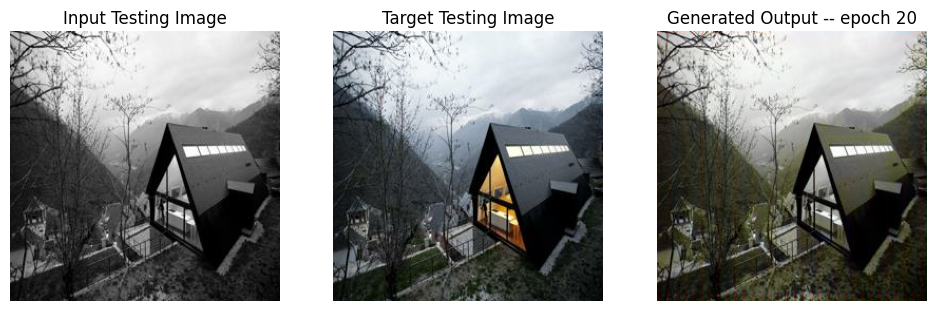

SSIM Score: 0.9586784243583679
PSNR Score: 27.265289306640625
Epoch 20
Training Details
Generator-- total_loss:51.01136 gan_loss:43.51138 l1_loss:0.04189 perceptual_loss:0.00811 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.89419 PSNR 23.92834 LPIPS 0.00000
Time taken for epoch 21 is 1031.4357225894928 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.43515 gan_loss:0.02201 l1_loss:0.04138  perceptual_loss:0.00804 Discriminator-- total_loss:6.84820 real_loss:6.84391 generated_loss:0.00428 --- SSIM 0.93184 PSNR 23.98421 LPIPS 0.00000
Time taken for epoch 21 is 1071.30397439003 sec
Number of iteration 63
Displaying one random test image...


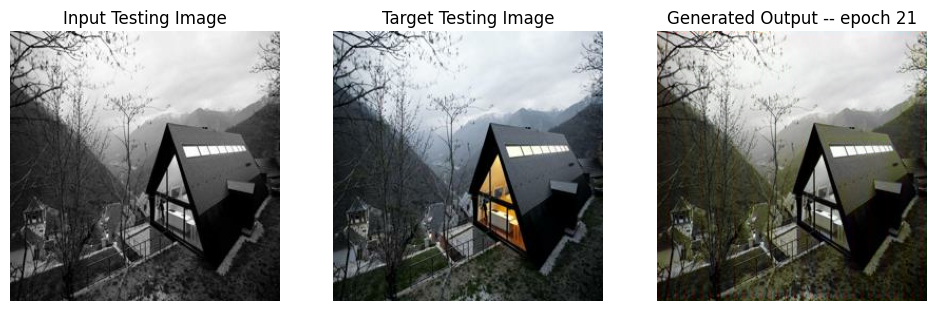

SSIM Score: 0.9592845439910889
PSNR Score: 27.33639907836914
Epoch 21
Training Details
Generator-- total_loss:88.51495 gan_loss:81.02499 l1_loss:0.04186 perceptual_loss:0.00808 Discriminator-- total_loss:0.10597 real_loss:0.05988 generated_loss:0.04609 --- SSIM 0.89507 PSNR 23.93880 LPIPS 0.00000
Time taken for epoch 22 is 1032.0499823093414 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.40238 gan_loss:0.85959 l1_loss:0.04218  perceptual_loss:0.00811 Discriminator-- total_loss:4.26961 real_loss:4.14843 generated_loss:0.12117 --- SSIM 0.92925 PSNR 23.96916 LPIPS 0.00000
Time taken for epoch 22 is 1072.1715586185455 sec
Number of iteration 63
Displaying one random test image...


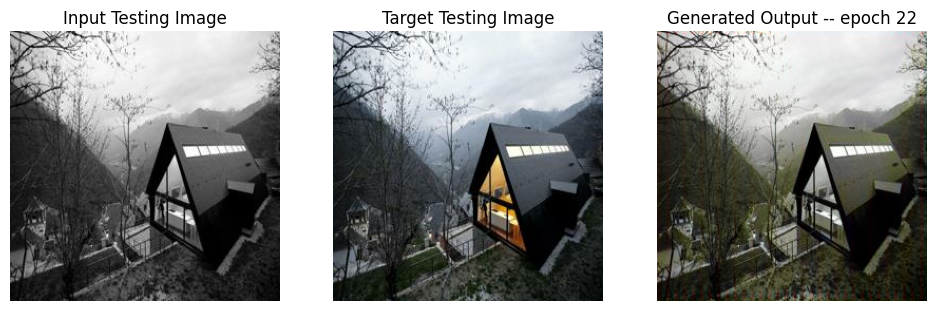

SSIM Score: 0.9587438106536865
PSNR Score: 27.258987426757812
Epoch 22
Training Details
Generator-- total_loss:99.19404 gan_loss:91.71773 l1_loss:0.04175 perceptual_loss:0.00809 Discriminator-- total_loss:0.00068 real_loss:0.00025 generated_loss:0.00043 --- SSIM 0.89536 PSNR 23.94600 LPIPS 0.00000
Time taken for epoch 23 is 1029.7289385795593 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.26197 gan_loss:0.02224 l1_loss:0.04049  perceptual_loss:0.00777 Discriminator-- total_loss:10.37492 real_loss:10.36477 generated_loss:0.01015 --- SSIM 0.93491 PSNR 24.17031 LPIPS 0.00000
Time taken for epoch 23 is 1069.8451430797577 sec
Number of iteration 63
Displaying one random test image...


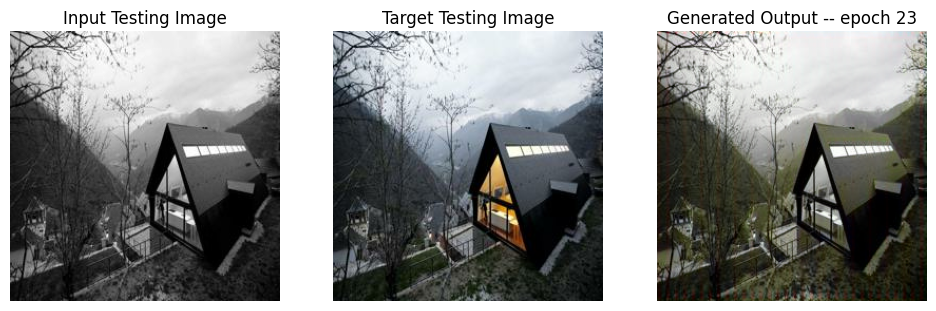

SSIM Score: 0.9586100578308105
PSNR Score: 27.245040893554688
Epoch 23
Training Details
Generator-- total_loss:94.08649 gan_loss:86.59152 l1_loss:0.04186 perceptual_loss:0.00810 Discriminator-- total_loss:0.00013 real_loss:0.00004 generated_loss:0.00009 --- SSIM 0.89463 PSNR 23.93112 LPIPS 0.00000
Time taken for epoch 24 is 1036.8068006038666 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.61250 gan_loss:0.03901 l1_loss:0.04245  perceptual_loss:0.00804 Discriminator-- total_loss:9.86393 real_loss:9.86075 generated_loss:0.00318 --- SSIM 0.92902 PSNR 23.85328 LPIPS 0.00000
Time taken for epoch 24 is 1077.9384517669678 sec
Number of iteration 63
Displaying one random test image...


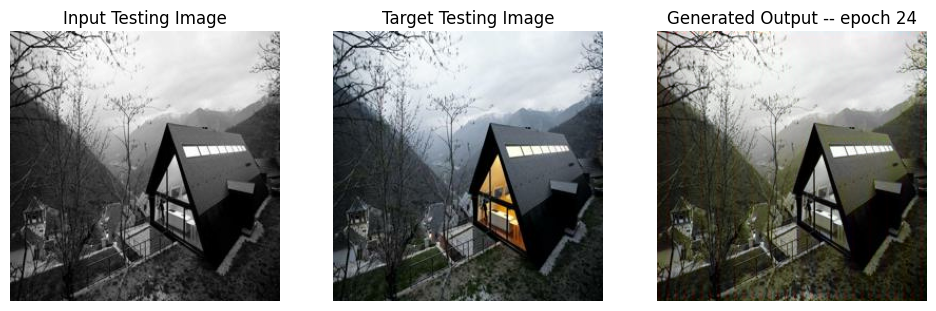

SSIM Score: 0.9585503935813904
PSNR Score: 27.25682830810547
Epoch 24
Training Details
Generator-- total_loss:97.65903 gan_loss:90.18519 l1_loss:0.04173 perceptual_loss:0.00809 Discriminator-- total_loss:0.00001 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.89448 PSNR 23.96315 LPIPS 0.00000
Time taken for epoch 25 is 1026.604498386383 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.51941 gan_loss:0.02696 l1_loss:0.04185  perceptual_loss:0.00810 Discriminator-- total_loss:9.46287 real_loss:9.46179 generated_loss:0.00108 --- SSIM 0.92949 PSNR 23.85484 LPIPS 0.00000
Time taken for epoch 25 is 1066.592007637024 sec
Number of iteration 63
Displaying one random test image...


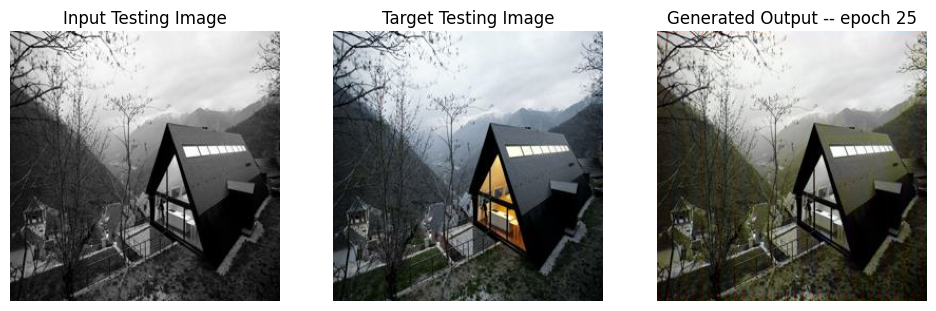

SSIM Score: 0.9585738182067871
PSNR Score: 27.24461555480957
Epoch 25
Training Details
Generator-- total_loss:97.86311 gan_loss:90.38965 l1_loss:0.04175 perceptual_loss:0.00807 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.89435 PSNR 23.95216 LPIPS 0.00000
Time taken for epoch 26 is 1022.0011768341064 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.41624 gan_loss:0.04382 l1_loss:0.04126  perceptual_loss:0.00789 Discriminator-- total_loss:9.16931 real_loss:9.16651 generated_loss:0.00279 --- SSIM 0.93192 PSNR 24.10779 LPIPS 0.00000
Time taken for epoch 26 is 1062.2734327316284 sec
Number of iteration 63
Displaying one random test image...


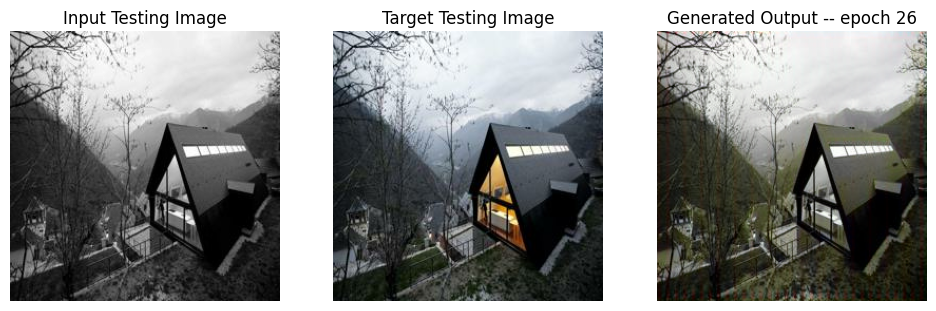

SSIM Score: 0.9590510725975037
PSNR Score: 27.2994327545166
Epoch 26
Training Details
Generator-- total_loss:99.24798 gan_loss:91.74255 l1_loss:0.04190 perceptual_loss:0.00813 Discriminator-- total_loss:0.00001 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.89479 PSNR 23.91645 LPIPS 0.00000
Time taken for epoch 27 is 1020.8711490631104 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.82189 gan_loss:0.20620 l1_loss:0.04237  perceptual_loss:0.00840 Discriminator-- total_loss:11.63547 real_loss:11.62477 generated_loss:0.01070 --- SSIM 0.93012 PSNR 23.85573 LPIPS 0.00000
Time taken for epoch 27 is 1060.908856868744 sec
Number of iteration 63
Displaying one random test image...


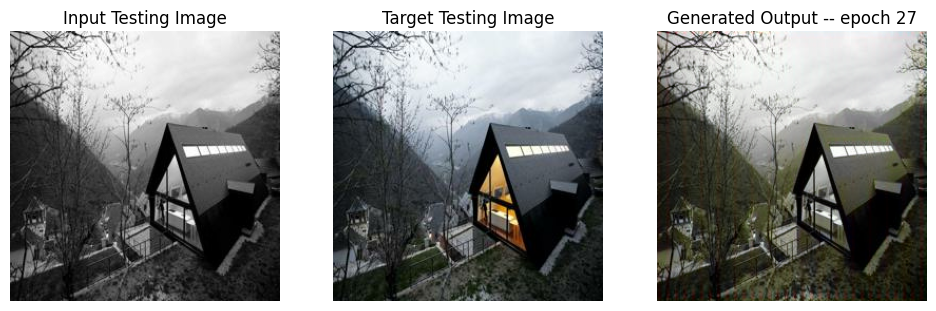

SSIM Score: 0.9588213562965393
PSNR Score: 27.287052154541016
Epoch 27
Training Details
Generator-- total_loss:98.40274 gan_loss:90.90568 l1_loss:0.04187 perceptual_loss:0.00811 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.89540 PSNR 23.93394 LPIPS 0.00000
Time taken for epoch 28 is 1019.171884059906 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.17163 gan_loss:0.00062 l1_loss:0.04005  perceptual_loss:0.00776 Discriminator-- total_loss:12.50594 real_loss:12.50581 generated_loss:0.00013 --- SSIM 0.93452 PSNR 24.33211 LPIPS 0.00000
Time taken for epoch 28 is 1059.8053669929504 sec
Number of iteration 63
Displaying one random test image...


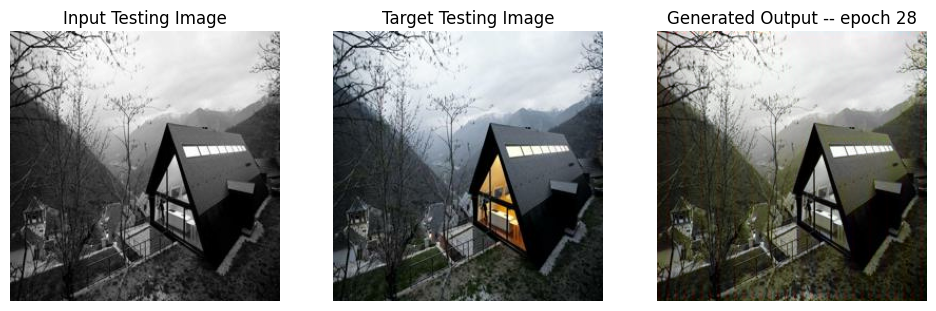

SSIM Score: 0.9587762951850891
PSNR Score: 27.280107498168945
Epoch 28
Training Details
Generator-- total_loss:98.14114 gan_loss:90.66151 l1_loss:0.04180 perceptual_loss:0.00806 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.89497 PSNR 23.95214 LPIPS 0.00000
Time taken for epoch 29 is 1019.2953209877014 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.48024 gan_loss:0.00002 l1_loss:0.04168  perceptual_loss:0.00819 Discriminator-- total_loss:15.56493 real_loss:15.56419 generated_loss:0.00074 --- SSIM 0.92929 PSNR 23.91035 LPIPS 0.00000
Time taken for epoch 29 is 1059.2253177165985 sec
Number of iteration 63
Displaying one random test image...


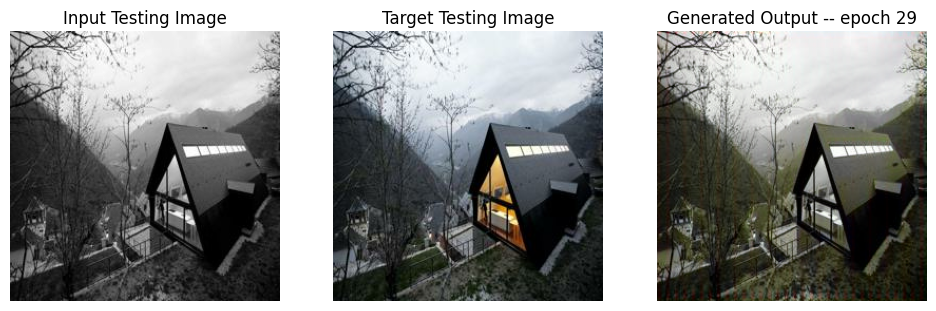

SSIM Score: 0.9585182070732117
PSNR Score: 27.243207931518555
Reduced generator learning rate to 0.0004500000213738531 at epoch 29
Epoch 29
Training Details
Generator-- total_loss:7.53515 gan_loss:0.12337 l1_loss:0.04134 perceptual_loss:0.00807 Discriminator-- total_loss:24.47930 real_loss:24.47930 generated_loss:0.00000 --- SSIM 0.89536 PSNR 23.92248 LPIPS 0.00000
Time taken for epoch 30 is 1377.7126595973969 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:6.99989 gan_loss:0.00000 l1_loss:0.03901  perceptual_loss:0.00766 Discriminator-- total_loss:25.41429 real_loss:25.41429 generated_loss:0.00000 --- SSIM 0.94163 PSNR 24.35994 LPIPS 0.00000
Time taken for epoch 30 is 1418.8291957378387 sec
Number of iteration 63
Displaying one random test image...


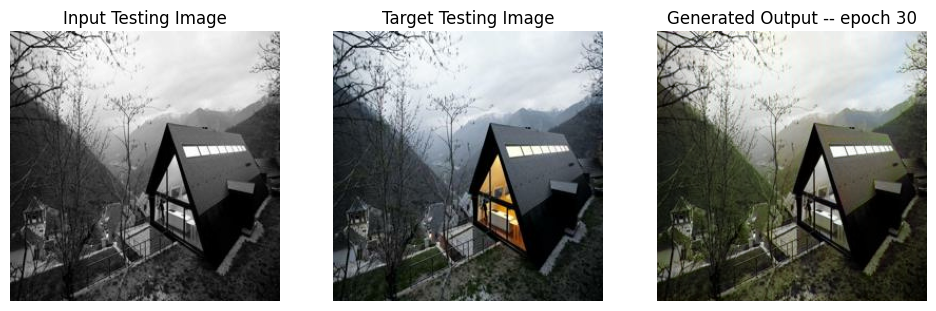

SSIM Score: 0.9653889536857605
PSNR Score: 27.24994659423828
Epoch 30
Training Details
Generator-- total_loss:7.19429 gan_loss:0.01062 l1_loss:0.04008 perceptual_loss:0.00781 Discriminator-- total_loss:26.22130 real_loss:26.22130 generated_loss:0.00000 --- SSIM 0.90125 PSNR 24.20146 LPIPS 0.00000
Time taken for epoch 31 is 1385.4594626426697 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:6.82660 gan_loss:0.00000 l1_loss:0.03813  perceptual_loss:0.00738 Discriminator-- total_loss:24.51640 real_loss:24.51615 generated_loss:0.00025 --- SSIM 0.94459 PSNR 24.68805 LPIPS 0.00000
Time taken for epoch 31 is 1426.4311339855194 sec
Number of iteration 63
Displaying one random test image...


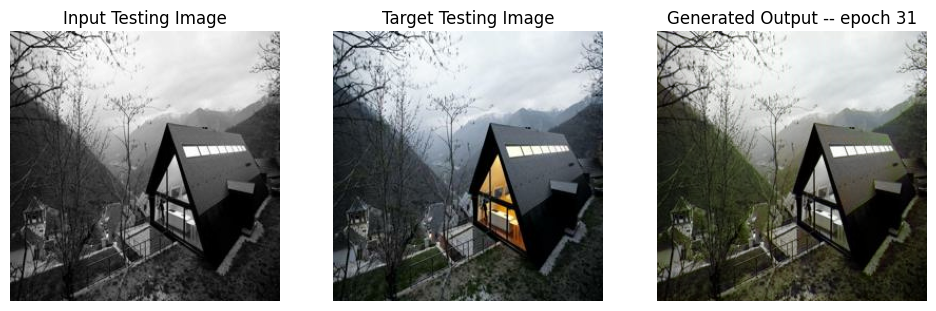

SSIM Score: 0.9682175517082214
PSNR Score: 27.772842407226562
Epoch 31
Training Details
Generator-- total_loss:7.17272 gan_loss:0.00778 l1_loss:0.04000 perceptual_loss:0.00777 Discriminator-- total_loss:26.16468 real_loss:26.16468 generated_loss:0.00000 --- SSIM 0.90403 PSNR 24.23848 LPIPS 0.00000
Time taken for epoch 32 is 1393.0722117424011 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.08417 gan_loss:0.00000 l1_loss:0.03925  perceptual_loss:0.00798 Discriminator-- total_loss:25.14771 real_loss:25.14771 generated_loss:0.00000 --- SSIM 0.94019 PSNR 24.36070 LPIPS 0.00000
Time taken for epoch 32 is 1435.1591687202454 sec
Number of iteration 63
Displaying one random test image...


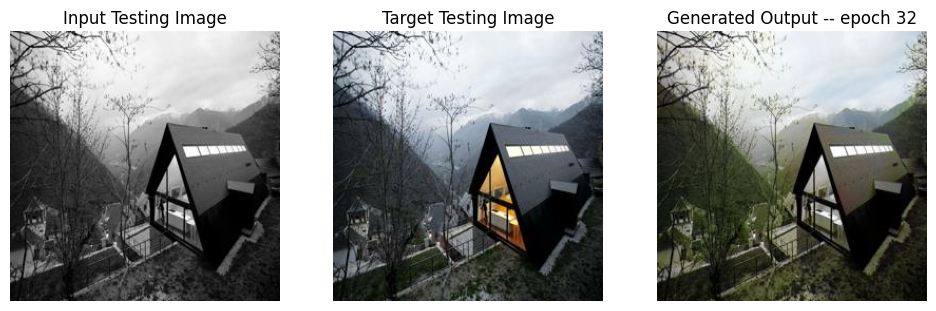

SSIM Score: 0.9676312804222107
PSNR Score: 27.298131942749023
Epoch 32
Training Details
Generator-- total_loss:7.14920 gan_loss:0.00773 l1_loss:0.03986 perceptual_loss:0.00775 Discriminator-- total_loss:26.23724 real_loss:26.23723 generated_loss:0.00001 --- SSIM 0.90437 PSNR 24.26446 LPIPS 0.00000
Time taken for epoch 33 is 1366.115507364273 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.08388 gan_loss:0.00000 l1_loss:0.03958  perceptual_loss:0.00764 Discriminator-- total_loss:25.54712 real_loss:25.54712 generated_loss:0.00000 --- SSIM 0.93883 PSNR 24.27089 LPIPS 0.00000
Time taken for epoch 33 is 1407.3213515281677 sec
Number of iteration 63
Displaying one random test image...


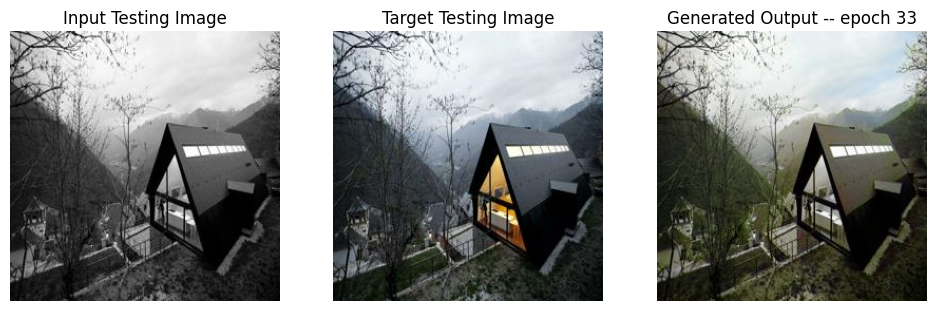

SSIM Score: 0.9662013649940491
PSNR Score: 27.437406539916992


In [55]:
fit(train_dataset, epochs, val, gen)

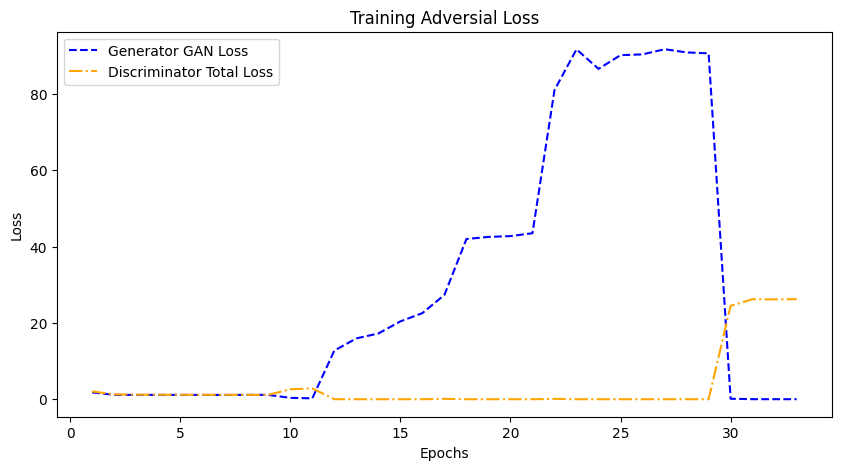

In [56]:
epochs = range(1, len(train_generator_losses) + 1)
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Training Adversial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

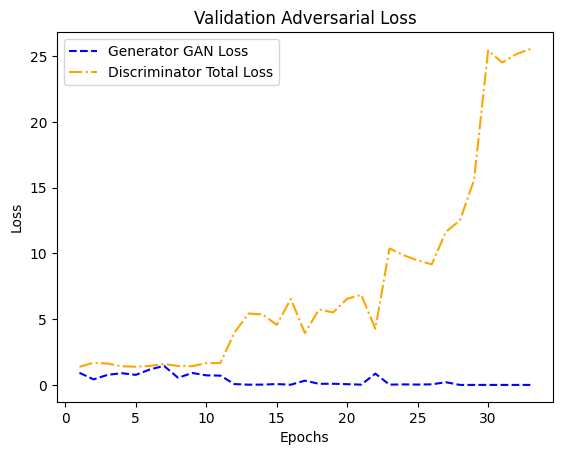

In [57]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Validation Adversarial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

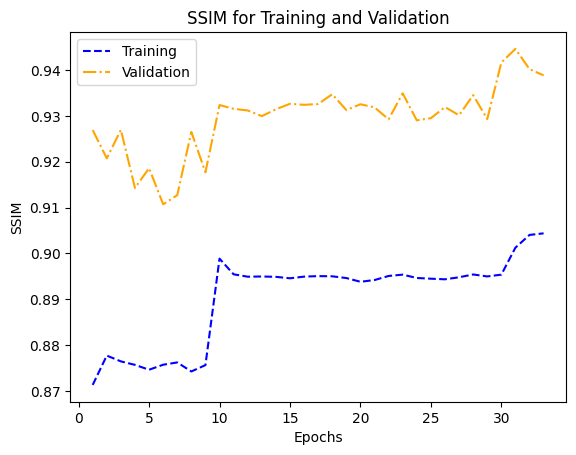

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

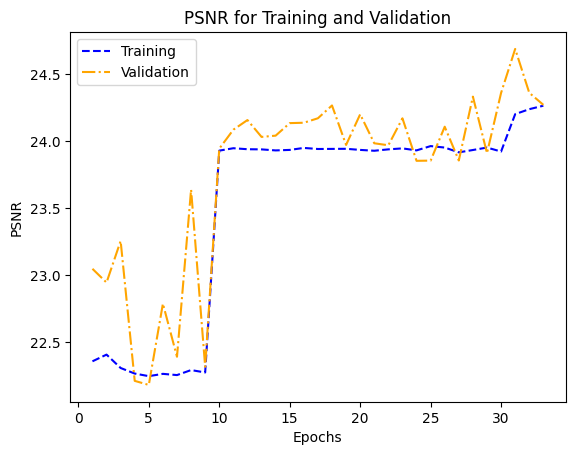

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

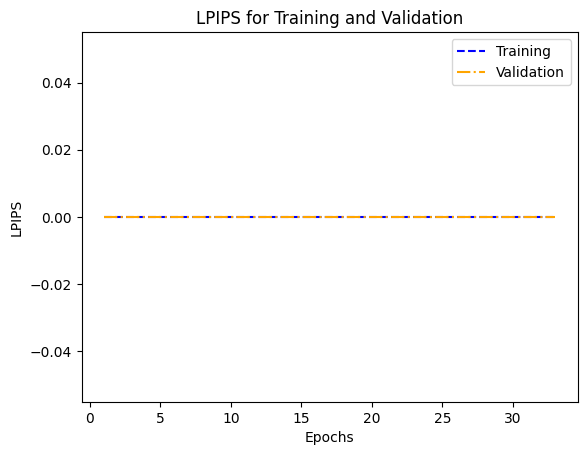

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

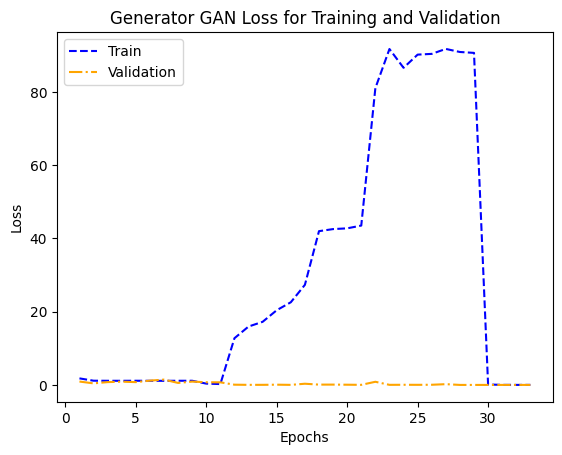

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

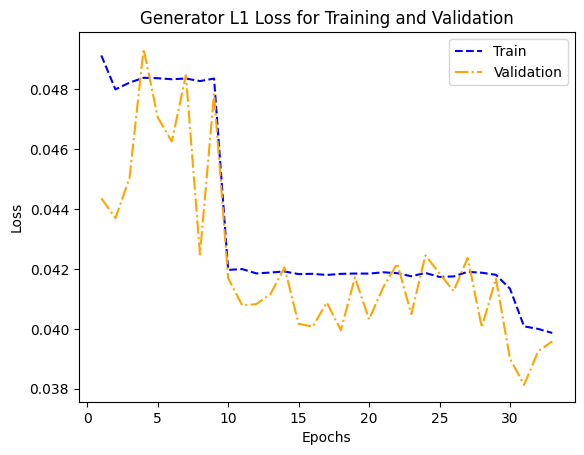

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

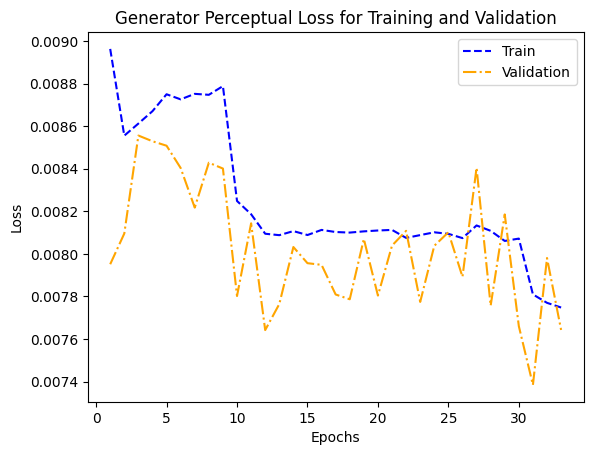

In [63]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

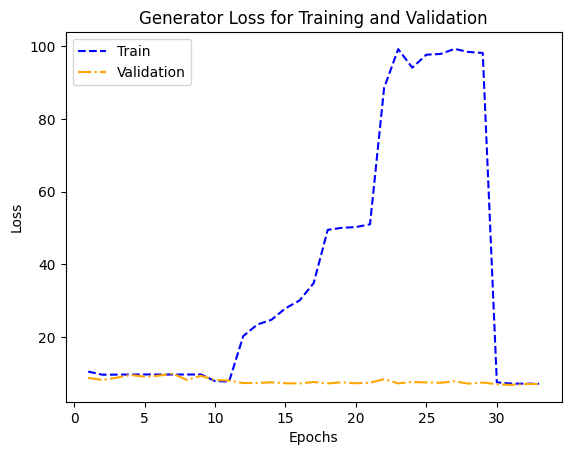

In [64]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

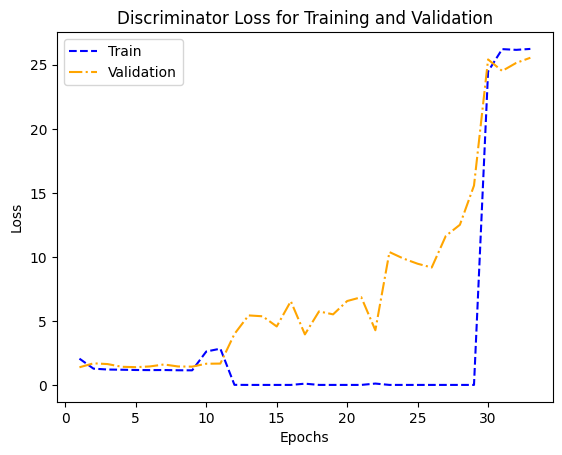

In [65]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

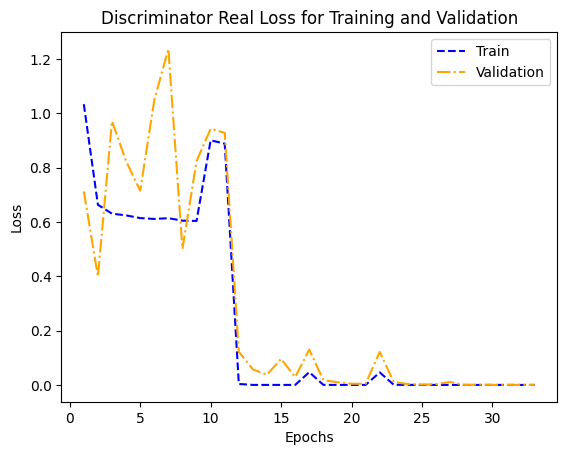

In [66]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

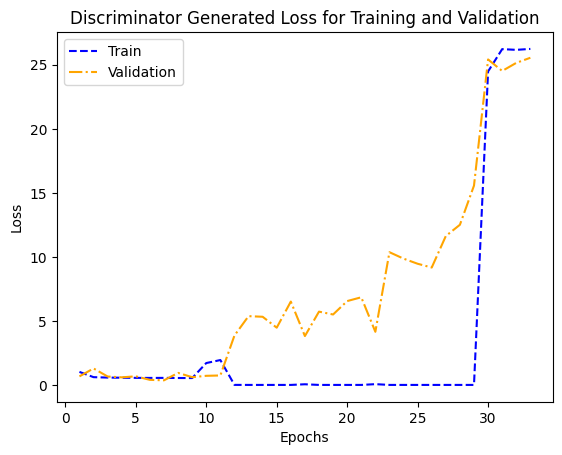

In [67]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [68]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [69]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [70]:
# os.mkdir('/kaggle/working/modelsFeb7')

In [71]:
# gen.save('/kaggle/working/modelsFeb7/gen.h5')
# gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
# disc.save('/kaggle/working/modelsFeb7/disc.h5')
# disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

In [72]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [73]:
import subprocess
from IPython.display import FileLink, display

In [74]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip